In [6]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from wave_prop_module import Wave2d
from torch import optim
from unet import UNet
from loss_fns import *
import lpips

In [69]:
def get_sobel_kernel_x(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = x
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

def get_sobel_kernel_y(k=15):
    # get range
    range = np.linspace(-(k // 2), k // 2, k)
    # compute a grid the numerator and the axis-distances
    x, y = np.meshgrid(range, range)
    sobel_2D_numerator = y
    sobel_2D_denominator = (x ** 2 + y ** 2)
    sobel_2D_denominator[:, k // 2] = 1  # avoid division by zero
    sobel_2D = sobel_2D_numerator / sobel_2D_denominator
    return sobel_2D

In [105]:
model = UNet(num_input_channels=1, num_output_channels=1) # postprocessor

# complete model
device = torch.device('cuda:0')

# incident wave
X, Y = np.meshgrid(np.linspace(-1, 1, 1024), np.linspace(-1, 1, 1360))

A = torch.tensor([X.T.ravel(), Y.T.ravel(), X.T.ravel()*Y.T.ravel(), X.T.ravel()*X.T.ravel(), Y.T.ravel()*Y.T.ravel(), np.ones_like(X.T.ravel()), 
              (X.T.ravel())**3, (Y.T.ravel())**3, X.T.ravel()*(Y.T.ravel())**2, Y.T.ravel()*(X.T.ravel())**2], dtype=torch.float32).T


# coeffs = torch.rand(10, 1, requires_grad=True)
# coeffs = torch.FloatTensor(10, 1).uniform_(-1, 1)
coeffs = torch.tensor([[ -13.53], [-113.3250], [ -12.7425], [   4.4154], [   6.2158], 
                       [ -119.261], [   2.3329], [  1.3617], [   1.5364], [  3.5796]])
coeffs.requires_grad=True

# obj_amp = torch.rand(1024, 1360, requires_grad=True)
obj_phase = torch.rand(1024, 1360, requires_grad=True)
obj_amp = torch.rand(1024, 1360, requires_grad=True)

phase_img = np.load('phase_0.npy')
abs_img = np.load('abs_0.npy')

target_phase = torch.tensor(phase_img).T
target_abs = torch.tensor(abs_img).T

cons = torch.tensor(3.2, requires_grad=True)
dist = torch.tensor(155.003, requires_grad=True) # mm 

loss_fn_alex = lpips.LPIPS(net='alex') 

optimizer = optim.Adam([
    {'params': obj_phase, 'lr': 1e-1},
    {'params': obj_amp, 'lr': 1e-1},
    {'params': coeffs, 'lr': 1e-1},
    {'params': cons, 'lr': 1e-2},
    {'params': dist, 'lr': 1}
    ],
    lr=0.01, betas=(0.9, 0.999)
    )
optimizer_proc = optim.Adam([
    {'params': model.parameters(), 'lr': 2e-2}],
    lr=0.01, betas=(0.9, 0.999)
    )

wave_obj = Wave2d(
        numPx = list(obj_phase.shape), 
        sizePx = [6*1e-3, 6*1e-3], 
        wl = 550*1e-6
        )

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /home/kazim/anaconda3/envs/Phase_Unwrap_DIP/lib/python3.8/site-packages/lpips/weights/v0.1/alex.pth


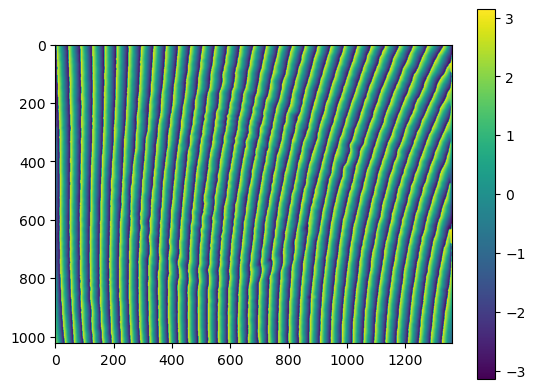

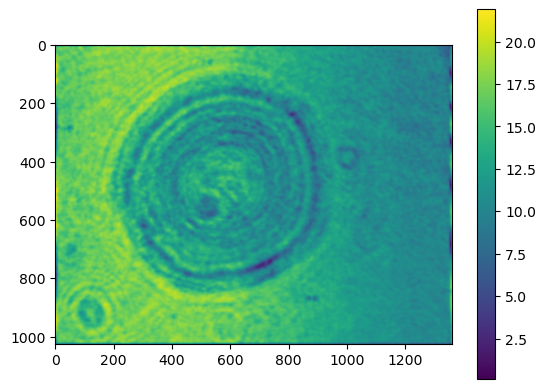

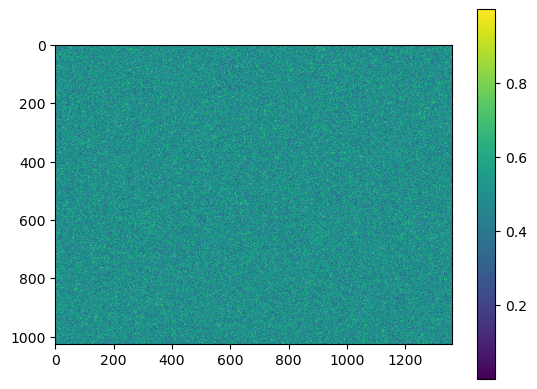

In [106]:
plt.imshow(target_phase.T)
plt.colorbar()
plt.show()

plt.imshow(target_abs.T)
plt.colorbar()
plt.show()

plt.imshow(obj_phase.detach())
plt.colorbar()
plt.show()

0 0.6633858437069635 156.0030059814453 13.251951217651367


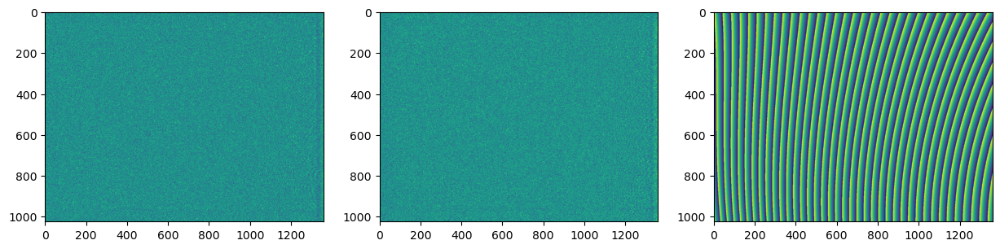

1 0.48360758837468154 156.6591339111328 13.251951217651367
2 0.3916772616931219 157.21554565429688 13.251951217651367
3 0.3686081837651822 157.30242919921875 13.251951217651367
4 0.3603827909332429 156.8927459716797 13.251951217651367
5 0.3522728156273597 156.9970245361328 13.251951217651367
6 0.33191538544687793 157.0828399658203 13.251951217651367
7 0.31102945416090294 157.01559448242188 13.251951217651367
8 0.2932787661752644 157.22767639160156 13.251951217651367
9 0.2816298557581182 157.21319580078125 13.251951217651367
10 0.26959575840405303 157.1073455810547 13.251951217651367
11 0.26204792615480677 157.35220336914062 13.251951217651367
12 0.25281685428593254 157.46768188476562 13.251951217651367
13 0.24475415365303724 157.41354370117188 13.251951217651367
14 0.23529652859333353 157.466064453125 13.251951217651367
15 0.2278092551821041 157.46743774414062 13.251951217651367
16 0.22075549089250543 157.5085906982422 13.251951217651367
17 0.21428841323340062 157.4676055908203 13.2519

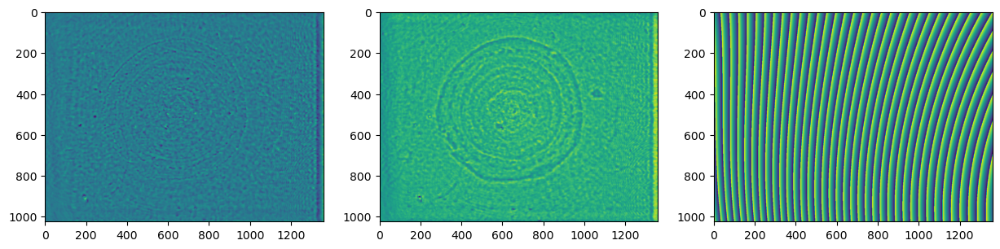

51 0.13640026247938042 157.68902587890625 13.251951217651367
52 0.13587881215776607 157.71592712402344 13.251951217651367
53 0.13528059366028244 157.73020935058594 13.251951217651367
54 0.13473010554478454 157.69178771972656 13.251951217651367
55 0.13394611734117282 157.71652221679688 13.251951217651367
56 0.13389667818354561 157.7067108154297 13.251951217651367
57 0.13321672757416603 157.69606018066406 13.251951217651367
58 0.132445164744025 157.7305450439453 13.251951217651367
59 0.13216002493119555 157.72096252441406 13.251951217651367
60 0.13171245480605492 157.68943786621094 13.251951217651367
61 0.1312442144667647 157.73312377929688 13.251951217651367
62 0.13084665436219128 157.70712280273438 13.251951217651367
63 0.13049654205542666 157.71981811523438 13.251951217651367
64 0.12989751806850358 157.7217254638672 13.251951217651367
65 0.1295722846194638 157.73435974121094 13.251951217651367
66 0.12898590253142084 157.7185821533203 13.251951217651367
67 0.12854737593116292 157.73439

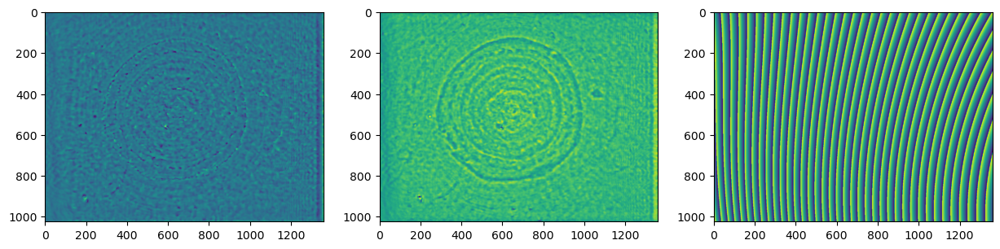

101 0.1190310843067509 157.76510620117188 13.251951217651367
102 0.11863206437971593 157.79364013671875 13.251951217651367
103 0.11907159832913125 157.8241729736328 13.251951217651367
104 0.11848808275222125 157.7789764404297 13.251951217651367
105 0.11844553894515505 157.8369140625 13.251951217651367
106 0.11873773784259692 157.76707458496094 13.251951217651367
107 0.11819347855335822 157.8074188232422 13.251951217651367
108 0.11788718074763249 157.8169403076172 13.251951217651367
109 0.117569171837827 157.81272888183594 13.251951217651367
110 0.11738603730117728 157.81239318847656 13.251951217651367
111 0.11714614562645888 157.77716064453125 13.251951217651367
112 0.11694096653832084 157.81610107421875 13.251951217651367
113 0.1165804529689734 157.81321716308594 13.251951217651367
114 0.11622767348070588 157.8064422607422 13.251951217651367
115 0.11614267750257791 157.7848358154297 13.251951217651367
116 0.11592160145611169 157.82916259765625 13.251951217651367
117 0.1156798656911476

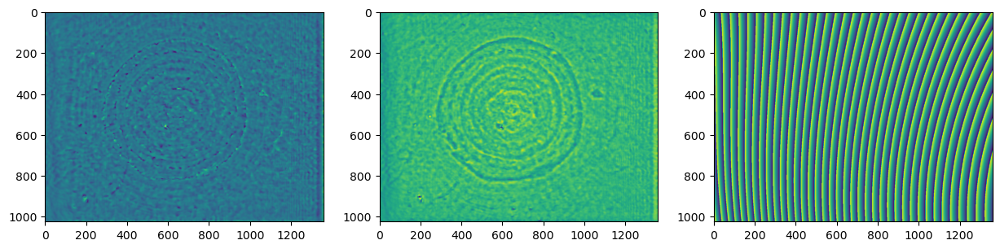

151 0.11002772735204727 157.86717224121094 13.251951217651367
152 0.1096918327117695 157.8902130126953 13.251951217651367
153 0.11023022967805333 157.85520935058594 13.251951217651367
154 0.11033397003803214 157.8524932861328 13.251951217651367
155 0.1096587121289804 157.87515258789062 13.251951217651367
156 0.10937163912978135 157.86802673339844 13.251951217651367
157 0.10909752508271091 157.8626251220703 13.251951217651367
158 0.10884973592579845 157.86029052734375 13.251951217651367
159 0.10879700589102065 157.8838653564453 13.251951217651367
160 0.10914169237184188 157.8822021484375 13.251951217651367
161 0.10870008159364619 157.88119506835938 13.251951217651367
162 0.10871620590804673 157.84129333496094 13.251951217651367
163 0.10863888729151049 157.8958740234375 13.251951217651367
164 0.10825067700715726 157.86341857910156 13.251951217651367
165 0.10832394143720522 157.89817810058594 13.251951217651367
166 0.10777570338075201 157.87022399902344 13.251951217651367
167 0.1079732372

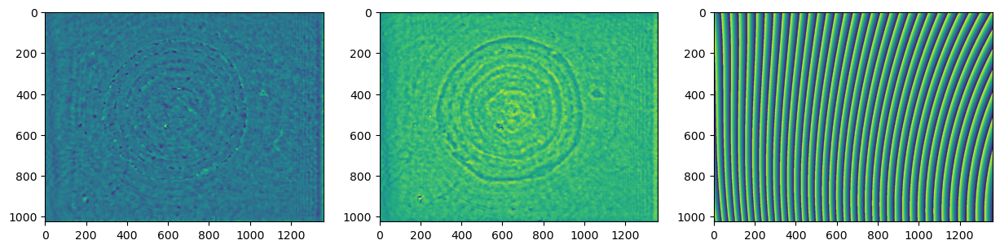

201 0.10383663645017095 157.95603942871094 13.251951217651367
202 0.1033182722251495 157.93946838378906 13.251951217651367
203 0.1039325606145357 157.9065399169922 13.251951217651367
204 0.103387461135012 158.00796508789062 13.251951217651367
205 0.1032551355304232 157.99322509765625 13.251951217651367
206 0.10347295990657826 157.9316864013672 13.251951217651367
207 0.10323680231265657 157.94287109375 13.251951217651367
208 0.10338586257751631 157.95518493652344 13.251951217651367
209 0.10356279837025996 157.94784545898438 13.251951217651367
210 0.10290151866051063 157.98452758789062 13.251951217651367
211 0.10291789568941215 157.93150329589844 13.251951217651367
212 0.10261115128267784 157.98165893554688 13.251951217651367
213 0.10248198038346037 157.96432495117188 13.251951217651367
214 0.10247081882135349 157.97166442871094 13.251951217651367
215 0.10224733529872153 157.9615020751953 13.251951217651367
216 0.10271817283393622 157.90740966796875 13.251951217651367
217 0.1023255980966

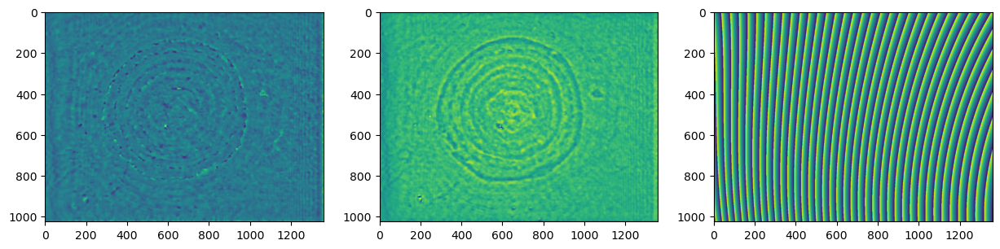

251 0.09868691325332471 158.01402282714844 13.251951217651367
252 0.09849700178053729 158.02081298828125 13.251951217651367
253 0.09835887303999524 158.00025939941406 13.251951217651367
254 0.09862528853069417 158.00616455078125 13.251951217651367
255 0.09876929609225862 158.0627899169922 13.251951217651367
256 0.09842432275682568 158.0068359375 13.251951217651367
257 0.09846413040892388 158.0116424560547 13.251951217651367
258 0.09834442282813921 158.0501251220703 13.251951217651367
259 0.0984119906408061 157.96543884277344 13.251951217651367
260 0.0987370274269491 158.07754516601562 13.251951217651367
261 0.09868360098963626 158.04275512695312 13.251951217651367
262 0.09827249249822498 158.00750732421875 13.251951217651367
263 0.09809959116160386 158.05319213867188 13.251951217651367
264 0.0983395379097906 158.021240234375 13.251951217651367
265 0.09792110692101172 158.06729125976562 13.251951217651367
266 0.09780317565864732 158.01449584960938 13.251951217651367
267 0.09771728732171

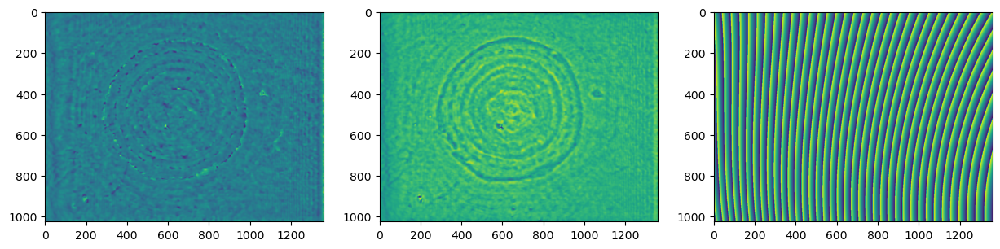

301 0.09494161071261246 158.0550994873047 13.251951217651367
302 0.09531676296240602 158.11305236816406 13.251951217651367
303 0.09491539723234801 158.06834411621094 13.251951217651367
304 0.09541927791209932 158.09674072265625 13.251951217651367
305 0.09494926720065588 158.06222534179688 13.251951217651367
306 0.0945346270612147 158.08087158203125 13.251951217651367
307 0.09480826353707654 158.09483337402344 13.251951217651367
308 0.0946043273934899 158.0818634033203 13.251951217651367
309 0.09430045428837662 158.07473754882812 13.251951217651367
310 0.09429006685295015 158.10060119628906 13.251951217651367
311 0.09400305682611372 158.09007263183594 13.251951217651367
312 0.09472653726670457 158.05186462402344 13.251951217651367
313 0.09439651489417782 158.13917541503906 13.251951217651367
314 0.0940906754096848 158.10169982910156 13.251951217651367
315 0.09384074648277096 158.07261657714844 13.251951217651367
316 0.09397479056458317 158.07586669921875 13.251951217651367
317 0.0942243

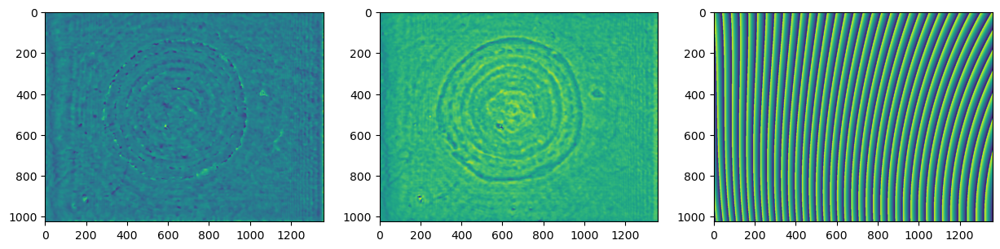

351 0.0915373857702369 158.08981323242188 13.251951217651367
352 0.09200010163801507 158.18716430664062 13.251951217651367
353 0.09193044819277332 158.1642303466797 13.251951217651367
354 0.09152754266725308 158.1204833984375 13.251951217651367
355 0.09139305987080668 158.12924194335938 13.251951217651367
356 0.09171306657620071 158.08181762695312 13.251951217651367
357 0.0916096712090418 158.21336364746094 13.251951217651367
358 0.09200134218708023 158.1842498779297 13.251951217651367
359 0.0918455333157489 158.09315490722656 13.251951217651367
360 0.09139148594486077 158.15147399902344 13.251951217651367
361 0.09153769380568544 158.12570190429688 13.251951217651367
362 0.0914967821413821 158.16558837890625 13.251951217651367
363 0.09164885739937075 158.1675262451172 13.251951217651367
364 0.0911680362986558 158.0968780517578 13.251951217651367
365 0.0911498576300137 158.1610565185547 13.251951217651367
366 0.09121116137052057 158.1744384765625 13.251951217651367
367 0.090995367706680

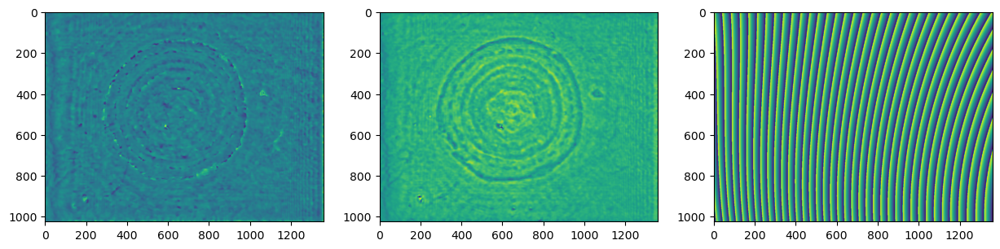

401 0.08946378754978222 158.1695098876953 13.251951217651367
402 0.08924925797601839 158.1793212890625 13.251951217651367
403 0.0887929576146097 158.1707763671875 13.251951217651367
404 0.089009590821547 158.1382598876953 13.251951217651367
405 0.08892130402143386 158.1713104248047 13.251951217651367
406 0.08902447967905748 158.1942901611328 13.251951217651367
407 0.08892905640898302 158.14169311523438 13.251951217651367
408 0.08893674669361752 158.23956298828125 13.251951217651367
409 0.08922075430804217 158.20257568359375 13.251951217651367
410 0.08879365201642495 158.1438446044922 13.251951217651367
411 0.08885911102707945 158.25453186035156 13.251951217651367
412 0.08911870527001499 158.260986328125 13.251951217651367
413 0.08863302590879409 158.2115478515625 13.251951217651367
414 0.08879833936200274 158.15457153320312 13.251951217651367
415 0.08874178380783879 158.2306365966797 13.251951217651367
416 0.0883949125627946 158.2154083251953 13.251951217651367
417 0.08848971915191954 

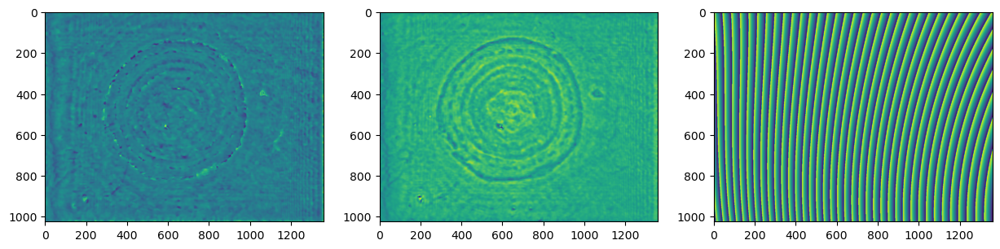

451 0.08706441487383682 158.275390625 13.251951217651367
452 0.08712531181918107 158.18539428710938 13.251951217651367
453 0.08729998268923636 158.2577667236328 13.251951217651367
454 0.08694748559689325 158.2630615234375 13.251951217651367
455 0.08695810307745006 158.2831573486328 13.251951217651367
456 0.08695990747123647 158.25099182128906 13.251951217651367
457 0.0864733208734901 158.28012084960938 13.251951217651367
458 0.08675659868321715 158.20901489257812 13.251951217651367
459 0.08664549665814102 158.2876739501953 13.251951217651367
460 0.08654775557026428 158.26856994628906 13.251951217651367
461 0.08636706338213046 158.2524871826172 13.251951217651367
462 0.08641886602982955 158.2388153076172 13.251951217651367
463 0.08617263651452398 158.2628631591797 13.251951217651367
464 0.0862157432721741 158.27743530273438 13.251951217651367
465 0.08629996670007169 158.26470947265625 13.251951217651367
466 0.08576108163532391 158.2665557861328 13.251951217651367
467 0.08570589799703202

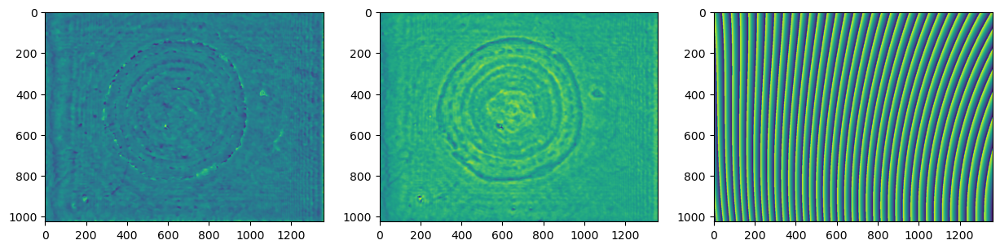

501 0.08493579058682686 158.2952117919922 13.251951217651367
502 0.08461217702424809 158.31857299804688 13.251951217651367
503 0.08475127980558574 158.29063415527344 13.251951217651367
504 0.08452376158688261 158.29168701171875 13.251951217651367
505 0.08492046605338258 158.27952575683594 13.251951217651367
506 0.08462635102230869 158.3538818359375 13.251951217651367
507 0.08463637413920827 158.29550170898438 13.251951217651367
508 0.08454217858205262 158.30055236816406 13.251951217651367
509 0.08441873597814357 158.26536560058594 13.251951217651367
510 0.08448168676789108 158.38970947265625 13.251951217651367
511 0.08495101361923077 158.35543823242188 13.251951217651367
512 0.08503911965648737 158.28578186035156 13.251951217651367
513 0.08457536610150997 158.3548583984375 13.251951217651367
514 0.08472229194315903 158.32870483398438 13.251951217651367
515 0.08441458551604245 158.34353637695312 13.251951217651367
516 0.0838613483522947 158.3190460205078 13.251951217651367
517 0.0846074

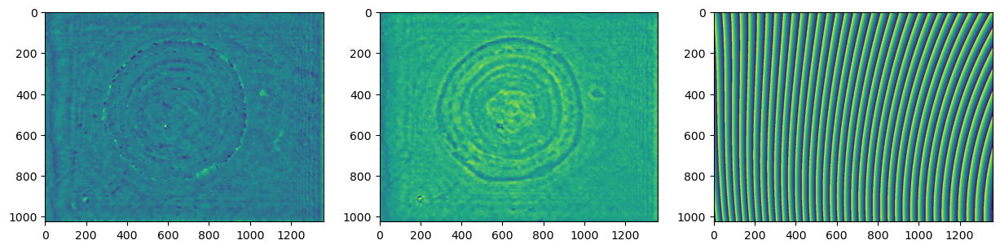

551 0.08341363709202201 158.39027404785156 13.251951217651367
552 0.0831920144513472 158.34335327148438 13.251951217651367
553 0.08330268101255364 158.3443145751953 13.251951217651367
554 0.08332556707248061 158.33377075195312 13.251951217651367
555 0.08306787767307555 158.40289306640625 13.251951217651367
556 0.0833023223311192 158.33331298828125 13.251951217651367
557 0.08311114353758836 158.37979125976562 13.251951217651367
558 0.0831949618343371 158.3005828857422 13.251951217651367
559 0.0833127752195578 158.38612365722656 13.251951217651367
560 0.08306119326578341 158.38429260253906 13.251951217651367
561 0.08293649211700396 158.33517456054688 13.251951217651367
562 0.08293686044517583 158.41064453125 13.251951217651367
563 0.08290923131945603 158.3795166015625 13.251951217651367
564 0.08280758146888785 158.37806701660156 13.251951217651367
565 0.08242344894521593 158.36131286621094 13.251951217651367
566 0.08230434329808542 158.35423278808594 13.251951217651367
567 0.082268702117

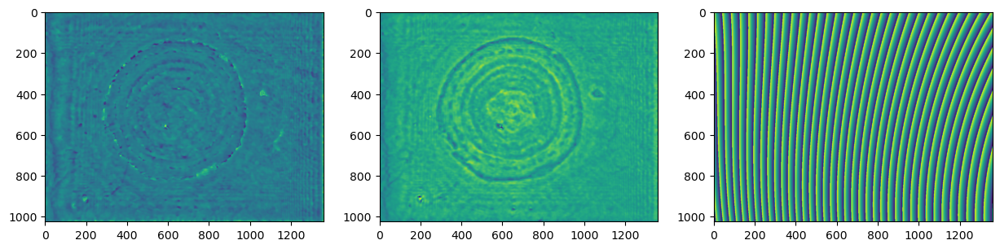

601 0.08162063854061792 158.43714904785156 13.251951217651367
602 0.08195682692980644 158.3520965576172 13.251951217651367
603 0.0821879441439056 158.4515380859375 13.251951217651367
604 0.08190453018781935 158.42819213867188 13.251951217651367
605 0.08167751535274068 158.42185974121094 13.251951217651367
606 0.08190486802031989 158.36407470703125 13.251951217651367
607 0.08162164519869898 158.49815368652344 13.251951217651367
608 0.08202600063800512 158.5294647216797 13.251951217651367
609 0.08198716389182889 158.4122772216797 13.251951217651367
610 0.08194102809094905 158.37240600585938 13.251951217651367
611 0.0820059282579959 158.46240234375 13.251951217651367
612 0.08207185005914618 158.43939208984375 13.251951217651367
613 0.08174456448301677 158.46856689453125 13.251951217651367
614 0.08153291387577075 158.41465759277344 13.251951217651367
615 0.08167222639089639 158.44015502929688 13.251951217651367
616 0.08142623220166671 158.38861083984375 13.251951217651367
617 0.08153027019

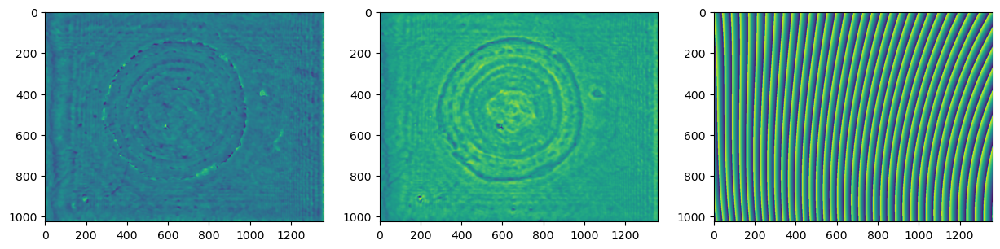

651 0.08047611828754644 158.46719360351562 13.251951217651367
652 0.08055721151640294 158.490234375 13.251951217651367
653 0.08051333273324224 158.42935180664062 13.251951217651367
654 0.08048906998969917 158.53736877441406 13.251951217651367
655 0.08066957805294178 158.54690551757812 13.251951217651367
656 0.08055645481698549 158.45260620117188 13.251951217651367
657 0.08040765657504477 158.4832763671875 13.251951217651367
658 0.08036522931079129 158.45730590820312 13.251951217651367
659 0.08019173461549256 158.517822265625 13.251951217651367
660 0.08066010263829246 158.5174102783203 13.251951217651367
661 0.08045753092285682 158.4524383544922 13.251951217651367
662 0.07997470455011788 158.50343322753906 13.251951217651367
663 0.08027804259110081 158.49037170410156 13.251951217651367
664 0.07994561327912904 158.47341918945312 13.251951217651367
665 0.08018755759521236 158.4993896484375 13.251951217651367
666 0.08019132617997025 158.4438018798828 13.251951217651367
667 0.08016807895687

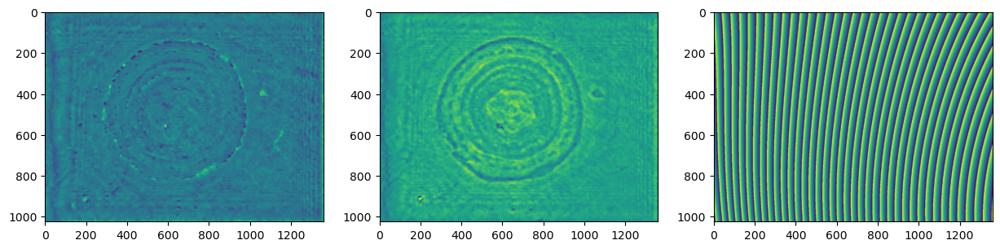

701 0.07975796294044962 158.4771270751953 13.251951217651367
702 0.07977677510721216 158.5880126953125 13.251951217651367
703 0.07955712992934734 158.57772827148438 13.251951217651367
704 0.07968929523018169 158.53662109375 13.251951217651367
705 0.07941979263586094 158.57046508789062 13.251951217651367
706 0.07961152654720417 158.4864501953125 13.251951217651367
707 0.07958305547475962 158.58447265625 13.251951217651367
708 0.07925584184424446 158.5868682861328 13.251951217651367
709 0.079375214050632 158.55902099609375 13.251951217651367
710 0.078969140876334 158.5472869873047 13.251951217651367
711 0.07910143313062165 158.5695037841797 13.251951217651367
712 0.07937697382743819 158.4698028564453 13.251951217651367
713 0.07972648694848368 158.59982299804688 13.251951217651367
714 0.07945159738814259 158.6119842529297 13.251951217651367
715 0.07948105394605469 158.52813720703125 13.251951217651367
716 0.07951391275941941 158.6156463623047 13.251951217651367
717 0.07953208241475287 158

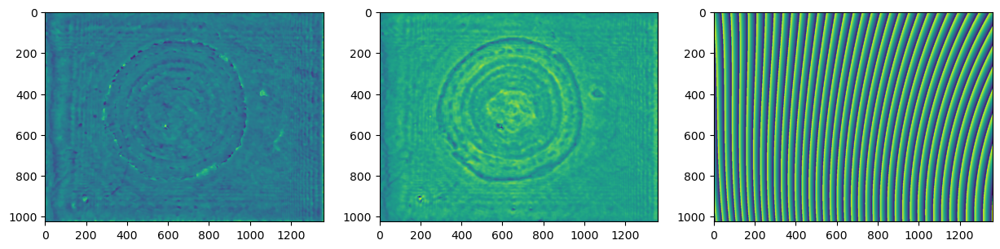

751 0.07872704055438687 158.62625122070312 13.251951217651367
752 0.07899900668115423 158.57516479492188 13.251951217651367
753 0.0784317542974072 158.63143920898438 13.251951217651367
754 0.07863055937386418 158.5435333251953 13.251951217651367
755 0.07885248335320616 158.64300537109375 13.251951217651367
756 0.07864338629940906 158.65467834472656 13.251951217651367
757 0.07860185565149377 158.5811309814453 13.251951217651367
758 0.07861887609309817 158.60801696777344 13.251951217651367
759 0.07864511647415079 158.5296630859375 13.251951217651367
760 0.07871596383705548 158.71868896484375 13.251951217651367
761 0.07871178003501514 158.7942352294922 13.251951217651367
762 0.07949705678642713 158.68936157226562 13.251951217651367
763 0.0785970940972251 158.5677032470703 13.251951217651367
764 0.07859147902417069 158.6207733154297 13.251951217651367
765 0.0790986270938498 158.6294708251953 13.251951217651367
766 0.0785586242961773 158.63418579101562 13.251951217651367
767 0.0783802769589

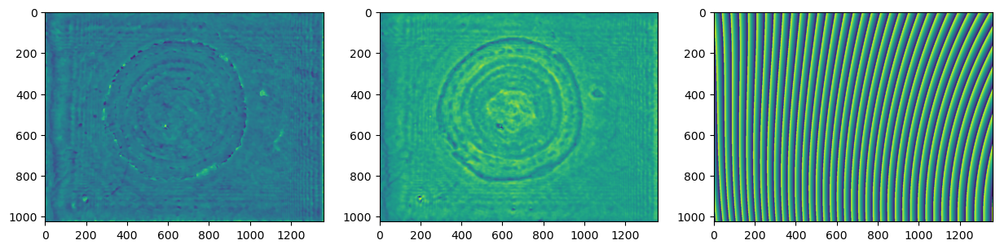

801 0.07774585158055387 158.6336212158203 13.251951217651367
802 0.07770182495597845 158.66506958007812 13.251951217651367
803 0.0776881938057549 158.68402099609375 13.251951217651367
804 0.0777081073281201 158.6931915283203 13.251951217651367
805 0.07756432338131725 158.6349334716797 13.251951217651367
806 0.07759545870430148 158.7022247314453 13.251951217651367
807 0.07801563717323362 158.6290740966797 13.251951217651367
808 0.07764955563336992 158.69764709472656 13.251951217651367
809 0.0776758294578839 158.66542053222656 13.251951217651367
810 0.07746756670081685 158.67120361328125 13.251951217651367
811 0.07742670218808309 158.6826934814453 13.251951217651367
812 0.07726449470392777 158.654296875 13.251951217651367
813 0.07737968077526314 158.66294860839844 13.251951217651367
814 0.07737571372559919 158.64048767089844 13.251951217651367
815 0.07707182642604964 158.73802185058594 13.251951217651367
816 0.07738272678944111 158.68983459472656 13.251951217651367
817 0.0775263540291474

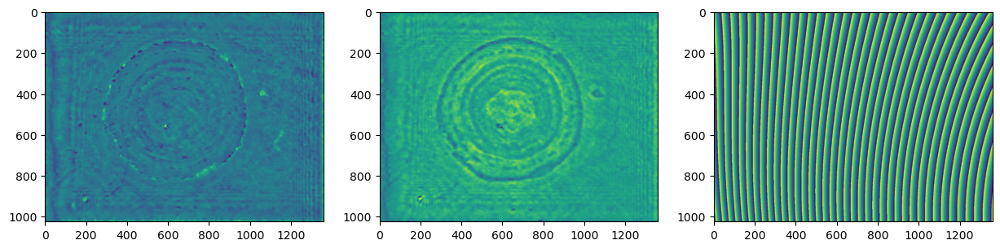

851 0.0765662602508061 158.6893768310547 13.251951217651367
852 0.07676209001366271 158.76406860351562 13.251951217651367
853 0.07674814569413566 158.70042419433594 13.251951217651367
854 0.07675019799870114 158.66944885253906 13.251951217651367
855 0.07695282277875846 158.78614807128906 13.251951217651367
856 0.07727259481854098 158.76788330078125 13.251951217651367
857 0.07708983900871635 158.6831512451172 13.251951217651367
858 0.0769074266830851 158.772216796875 13.251951217651367
859 0.0772705765264378 158.7416229248047 13.251951217651367
860 0.0770918185829372 158.75662231445312 13.251951217651367
861 0.07688493406269464 158.7081298828125 13.251951217651367
862 0.07679111025154423 158.73031616210938 13.251951217651367
863 0.07686498459821565 158.68431091308594 13.251951217651367
864 0.0769077432796824 158.83470153808594 13.251951217651367
865 0.07693481318653578 158.8843536376953 13.251951217651367
866 0.07720956197348659 158.76109313964844 13.251951217651367
867 0.07693822634431

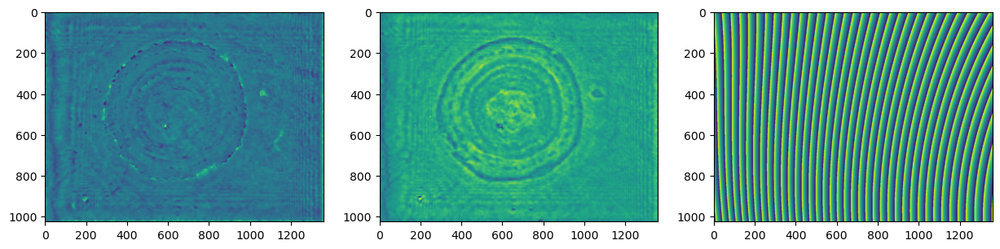

901 0.07681058538135715 158.887451171875 13.251951217651367
902 0.07655511125918481 158.9735565185547 13.251951217651367
903 0.07691687533459919 158.8829345703125 13.251951217651367
904 0.07682898940685093 158.8155975341797 13.251951217651367
905 0.07675015359035305 158.9029083251953 13.251951217651367
906 0.07675819643714024 158.88714599609375 13.251951217651367
907 0.07641167325257286 158.8791961669922 13.251951217651367
908 0.07619510003308438 158.8354949951172 13.251951217651367
909 0.07608399695187222 158.90493774414062 13.251951217651367
910 0.07604621589506529 158.8335723876953 13.251951217651367
911 0.07623324344334677 158.8622589111328 13.251951217651367
912 0.07621630924235584 158.87161254882812 13.251951217651367
913 0.07590565267884787 158.83192443847656 13.251951217651367
914 0.07593406388286714 158.89569091796875 13.251951217651367
915 0.07621713271012086 158.87237548828125 13.251951217651367
916 0.07564496345039892 158.86280822753906 13.251951217651367
917 0.075786286613

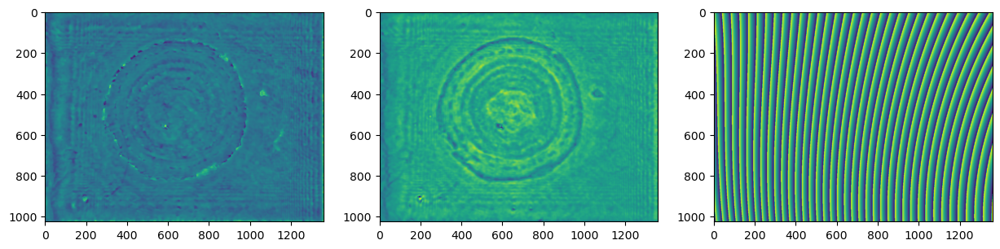

951 0.07545938324734984 158.92774963378906 13.251951217651367
952 0.07550455338644872 158.88336181640625 13.251951217651367
953 0.07538595102909634 158.96876525878906 13.251951217651367
954 0.07522394985090844 158.9460906982422 13.251951217651367
955 0.0751632767291568 158.94497680664062 13.251951217651367
956 0.0749703023658576 158.8746795654297 13.251951217651367
957 0.07548711134551371 159.070068359375 13.251951217651367
958 0.07611059267039857 159.14181518554688 13.251951217651367
959 0.07627975616320454 159.0439910888672 13.251951217651367
960 0.07586591766114292 158.96058654785156 13.251951217651367
961 0.07561498123236944 159.0006561279297 13.251951217651367
962 0.07531652115722852 158.93589782714844 13.251951217651367
963 0.07566081548601827 158.99708557128906 13.251951217651367
964 0.07541088658781042 158.98944091796875 13.251951217651367
965 0.07542120189219687 158.94537353515625 13.251951217651367
966 0.07528742688226212 158.97848510742188 13.251951217651367
967 0.0749776990

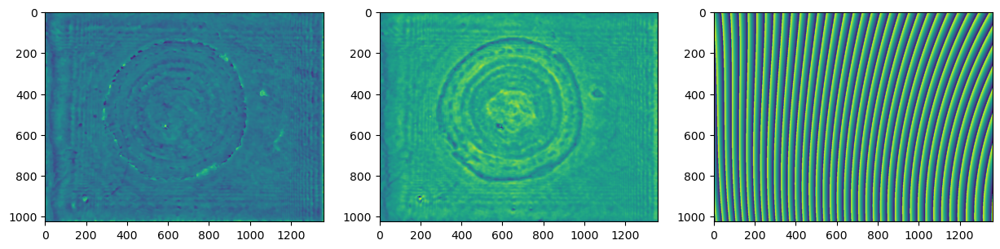

In [107]:
epochs = 1001
loss_arr = []

# kernel_x = torch.tensor(get_sobel_kernel_x(15)).float()
# kernel_y = torch.tensor(get_sobel_kernel_y(15)).float()

for itr in range(epochs):

    optimizer.zero_grad()
    # optimizer_proc.zero_grad()

    obj = obj_amp*torch.exp(1j*obj_phase)
    
    wave_phase = ((A)@coeffs).reshape(1024, 1360)
    wave = torch.exp(1j*wave_phase)
    
    wave_op = wave*obj

    wave_obj.wavefield(wave_op.T)
    # dist = torch.tensor(155.003) # mm
    wave_at_img = wave_obj.propogate(dist)
    wave_z = torch.angle(wave_at_img)
    wave_z += cons
    loss_phase = loss_fn(wave_z, target_phase)
    loss_amp = loss_fn(torch.abs(wave_at_img), target_abs)
    # loss_amp = l2_loss(torch.abs(wave_at_img).float(), target_abs.float())

    

    # grad_x = F.conv2d(obj_phase.float().unsqueeze(0).unsqueeze(0), kernel_x.unsqueeze(0).unsqueeze(0), padding=1, stride=1).detach().squeeze()
    # grad_y = F.conv2d(obj_phase.float().unsqueeze(0).unsqueeze(0), kernel_y.unsqueeze(0).unsqueeze(0), padding=1, stride=1).detach().squeeze()

    loss = 1.0*(loss_amp + loss_phase) + total_variation_loss(obj_phase, 0.1) + total_variation_loss(obj_amp, 0.1)
    # + 1/(grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean())

    # proc = model(obj_phase.unsqueeze(0).unsqueeze(0)).squeeze()
    # loss_proc = 0.9*l2_loss(proc, obj_phase) + total_variation_loss(proc, 0.1)

    loss.backward()
    # loss_proc.backward()
    
    optimizer.step()
    # optimizer_proc.step()

    loss_arr.append(loss.item())
    print(itr, loss_arr[-1], dist.item(), 
        #   (grad_x.ravel().abs().mean() + grad_y.ravel().abs().mean()).abs().item()
          ) 

    if (itr) % 50 == 0:

        fig, axs = plt.subplots(1, 3, figsize=(15, 8))

        axs[0].imshow(obj_phase.detach())
        # axs[1].imshow(proc.detach())
        axs[1].imshow(obj_amp.detach())
        axs[2].imshow(torch.angle(wave.detach()))

        plt.show()

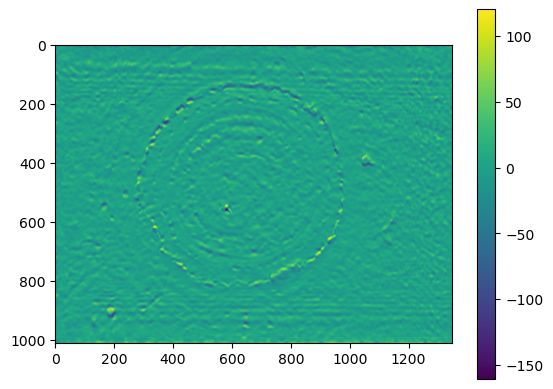

In [117]:
kernel = torch.tensor(get_sobel_kernel_y(15)).float()
op = F.conv2d(obj_phase.float().unsqueeze(0).unsqueeze(0), kernel.unsqueeze(0).unsqueeze(0), padding=1, stride=1).detach().squeeze()
plt.imshow(op)
plt.colorbar()

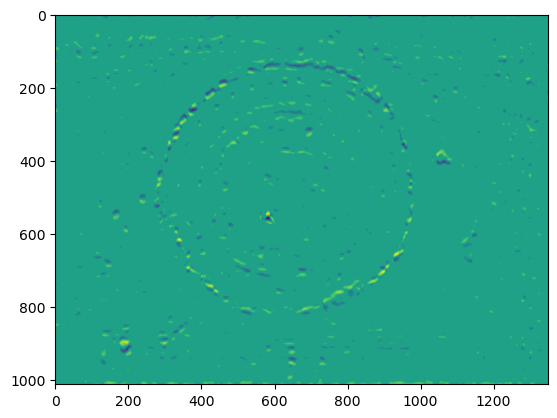

In [138]:
plt.imshow(torch.where(op.abs() >= 25, op, 0))

tensor(8.8837)

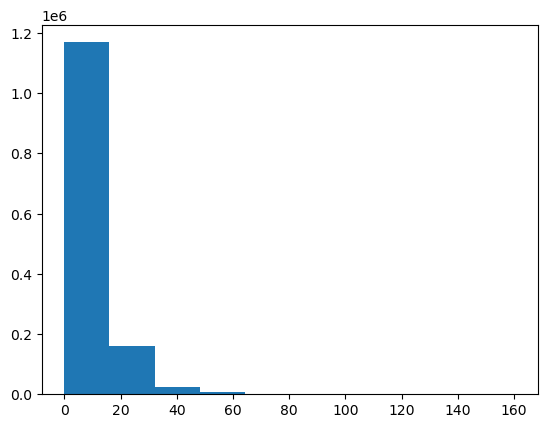

In [109]:
plt.hist(op.ravel().abs())
op.ravel().abs().mean()

In [139]:
dist, dist.grad, cons.grad, coeffs.grad, coeffs, (grad_x.ravel().mean() + grad_y.ravel().mean()).abs()

(tensor(159.0358, requires_grad=True),
 tensor(0.0022),
 tensor(-4.8111e-19),
 tensor([[-5.3448e-04],
         [ 8.2994e-04],
         [-3.4273e-04],
         [-3.7553e-04],
         [ 1.8636e-04],
         [-2.3283e-10],
         [-8.7010e-04],
         [ 7.6813e-04],
         [-1.9742e-04],
         [ 7.3072e-04]]),
 tensor([[ -12.6498],
         [-114.2776],
         [ -12.9550],
         [   4.8161],
         [   6.7583],
         [-118.9203],
         [   2.4158],
         [   2.5834],
         [   1.7045],
         [   4.1711]], requires_grad=True),
 tensor(0.0857))

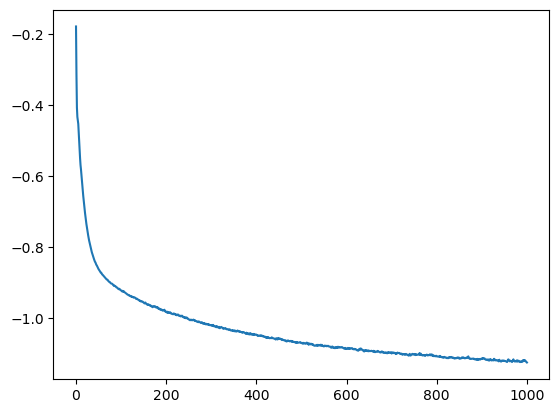

In [140]:
plt.plot(np.log10(loss_arr))

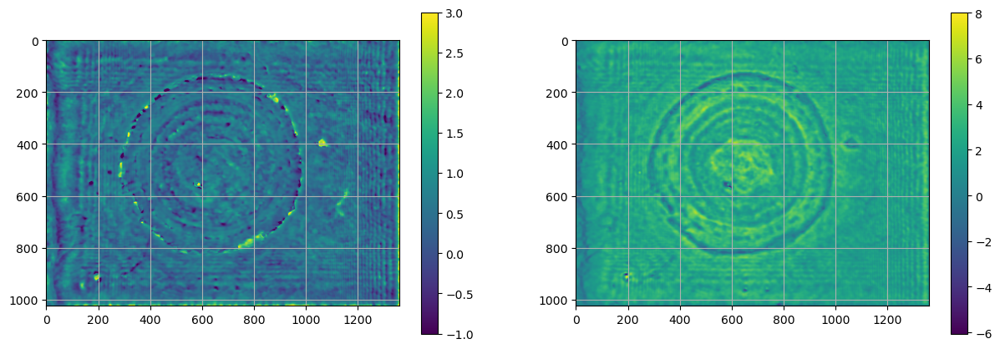

In [141]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

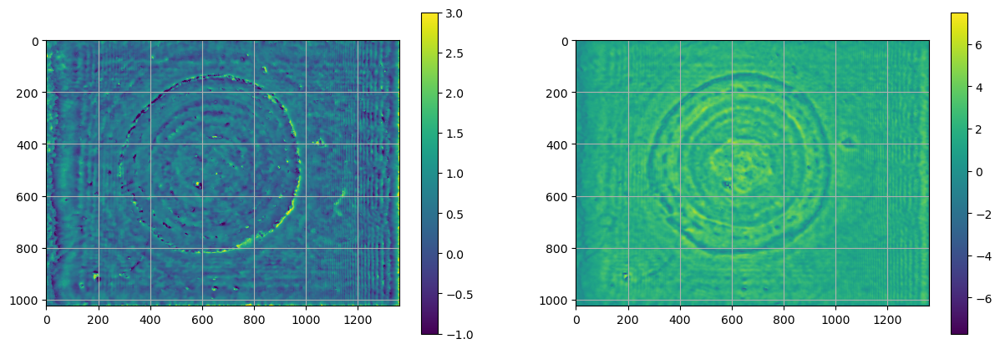

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

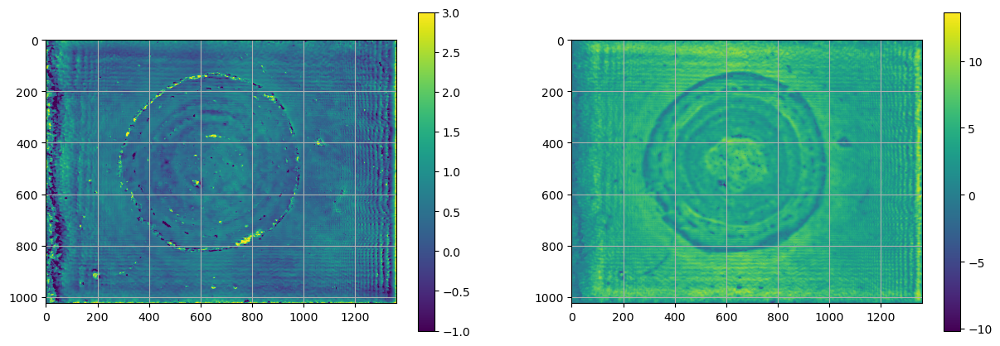

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(obj_amp.detach())
cm0 = axs[0].imshow(obj_phase.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

axs[0].grid()
axs[1].grid()

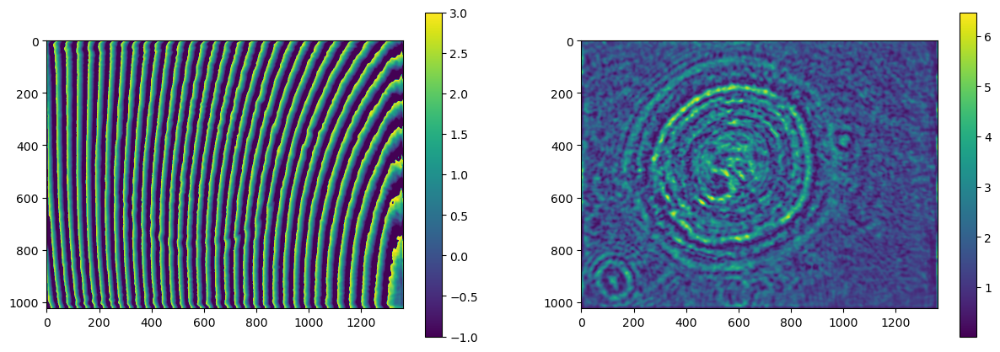

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

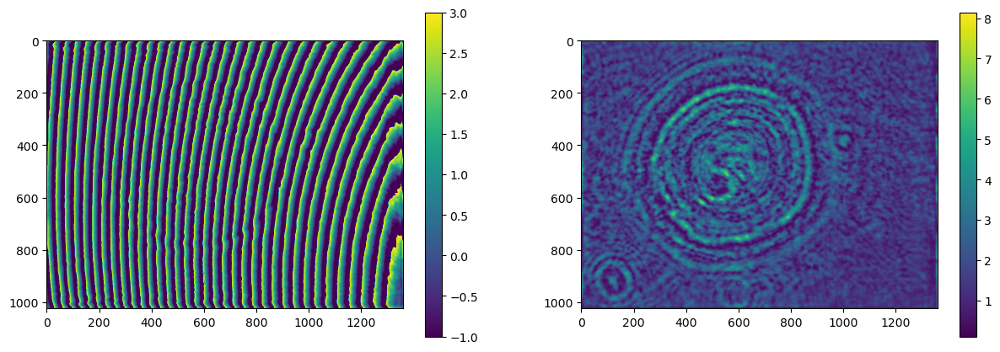

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

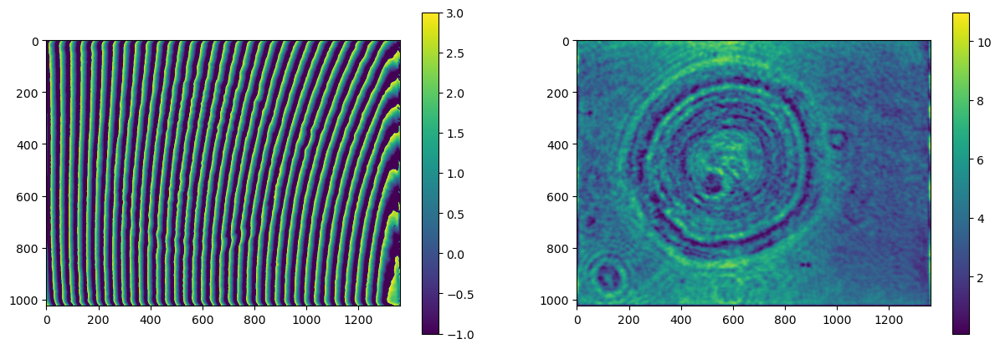

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))

cm1 = axs[1].imshow(torch.abs(wave_at_img).T.detach())
cm0 = axs[0].imshow(torch.angle(wave_at_img).T.detach(), vmin=-1, vmax=3)

fig.colorbar(cm0, ax=axs[0])
fig.colorbar(cm1, ax=axs[1])

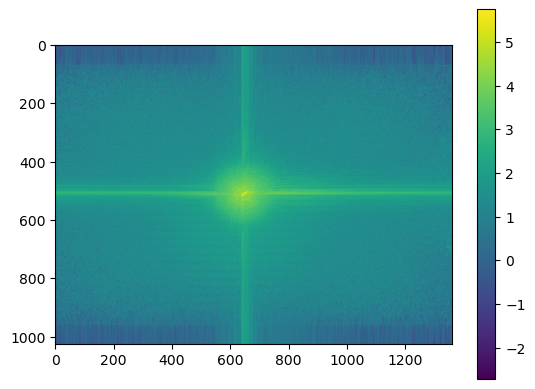

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

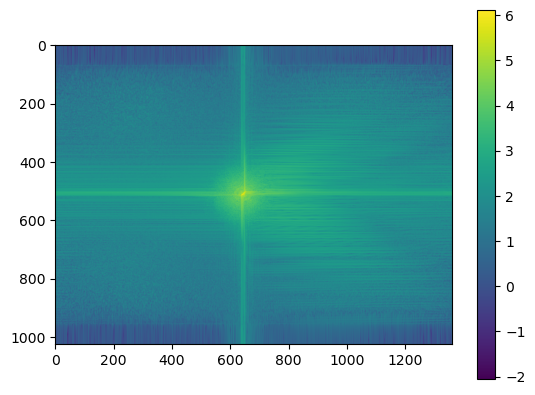

In [ ]:
plt.imshow(np.log10(torch.abs(torch.fft.fftshift(torch.fft.fft2(wave_at_img.detach())))).T)
plt.colorbar()

tensor([[ -12.7241],
        [-114.5435],
        [ -12.9551],
        [   4.7421],
        [   6.8633],
        [-118.1326],
        [   2.3889],
        [   2.4276],
        [   1.5576],
        [   3.9442]], requires_grad=True)

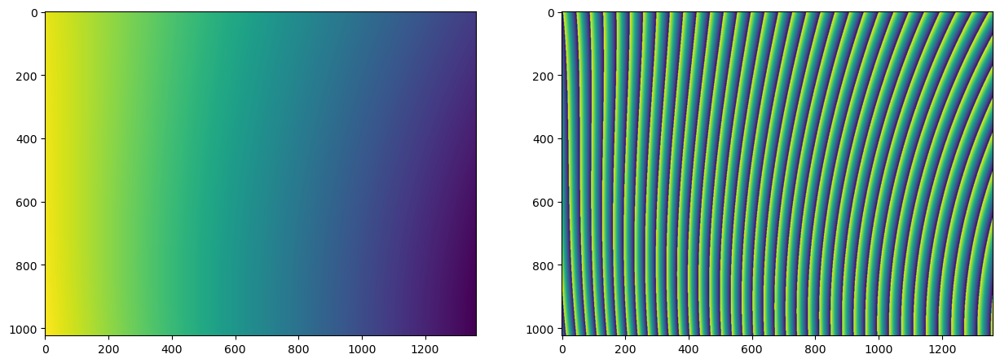

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

axs[1].imshow(torch.angle(wave).detach())
axs[0].imshow(wave_phase.detach())

coeffs

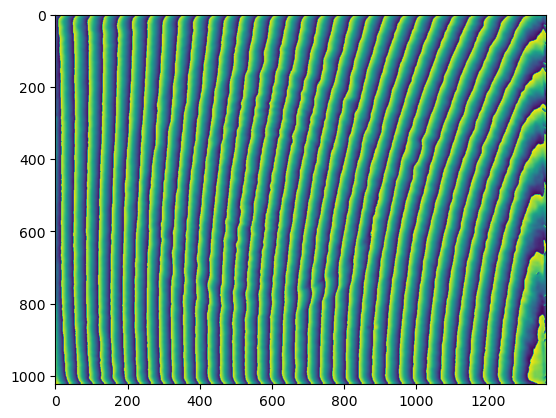

In [ ]:
plt.imshow(wave_z.detach().T)

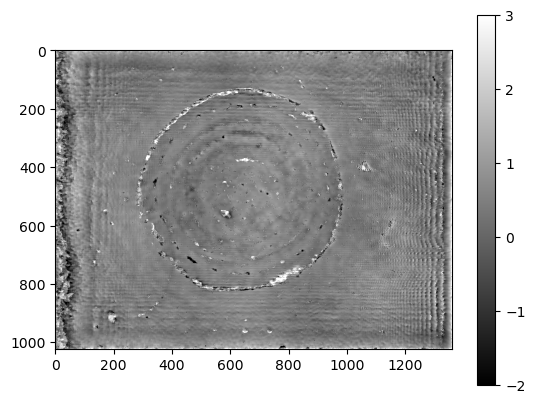

In [ ]:
plt.imshow((obj_phase.detach().numpy()), cmap='gray', vmin=-2, vmax=3)
plt.colorbar()